<a href="https://colab.research.google.com/github/DUTANGx/ImageGenerationSD1-5/blob/main/hust_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q diffusers transformers xformers
!pip install scipy ftfy accelerate
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux
!pip install torchsde

# **HUST 2023 Image Generation & Recommendation System Tutorial**

**主讲人：唐都**

主要工作经历

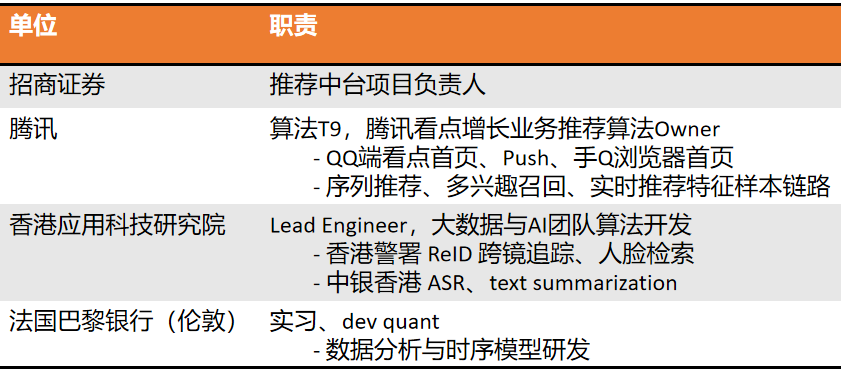


---





# 0. 本次tutorial涵盖的内容


## *   基于深度学习的图片生成技术发展
## *   目前大火的stable diffusion是什么，它是怎样工作的，我们如何使用
## *   diffusion model在推荐系统的应用

---

# **1. 基于深度学习的图片生成技术**

### 1.1 发展历程与范式
20年以前，图片生成的主要发展目标是提升出图质量。2020年CLIP的提出后图片生成与NLP模型逐步融合。
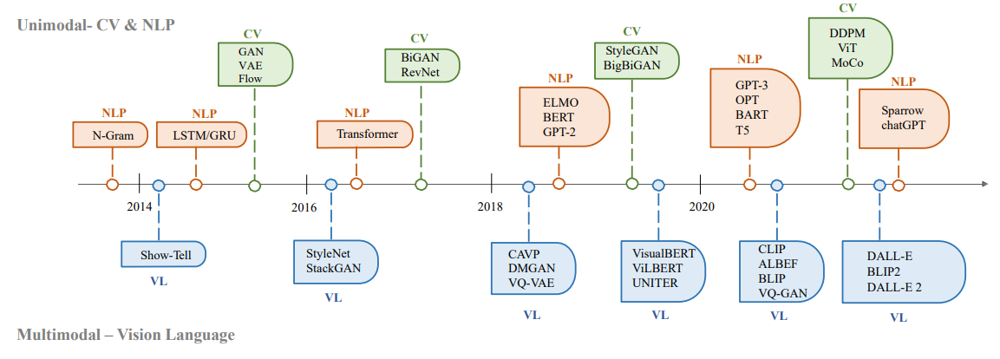
图片生成的主要范式：
*   GAN - a generator生成器 and a discriminator判别器。
*   VAE - Encoder Decoder架构，学习先验概率分布，decoder为生成模型。
*   Normalized Flow - 学习从复杂分布到简单分布的映射，其反函数为生成模型。
*   Diffusion Model - diffusion process（加噪声）训练，denoising process（降噪）推理。
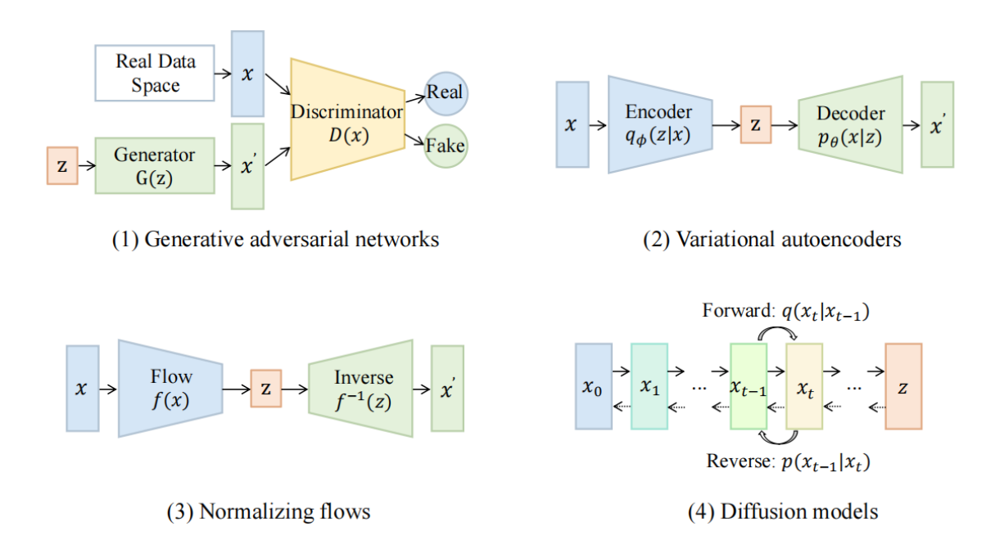

---


### 1.2 Variational Auto Encoder
AE的核心在于学习图像的低维表征。VAE相较于AE，通过学习超参数miu、sigma，可以更方便的控制latent space的隐变量。

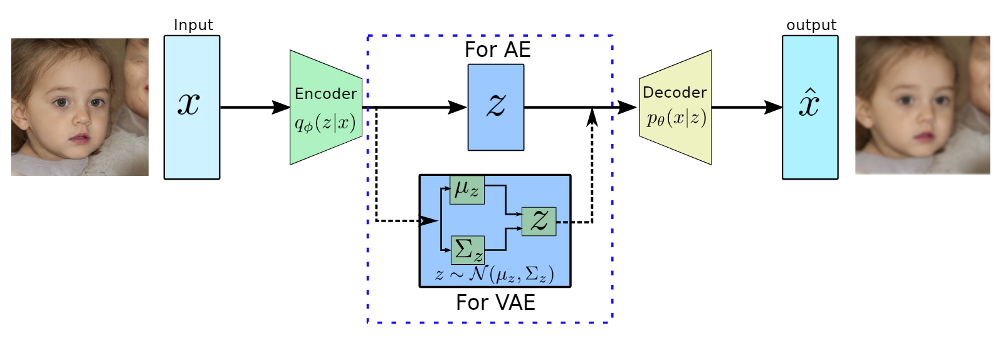

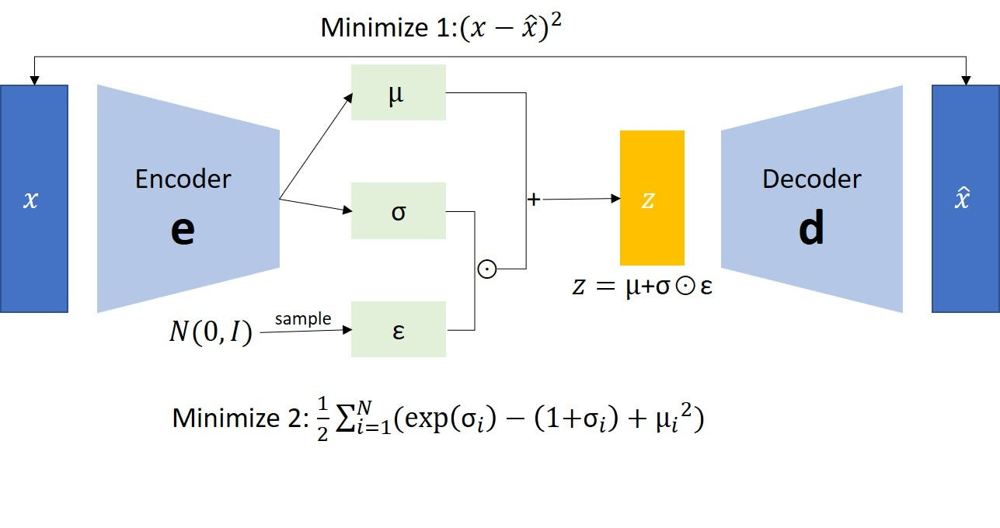

---

### 1.3 GAN & Style-GAN
GAN的输入隐变量易受到样本空间分布影响，style gan受到style transfer的启发，提出将隐变量植入生成器的每一层以控制不同的视觉特征。

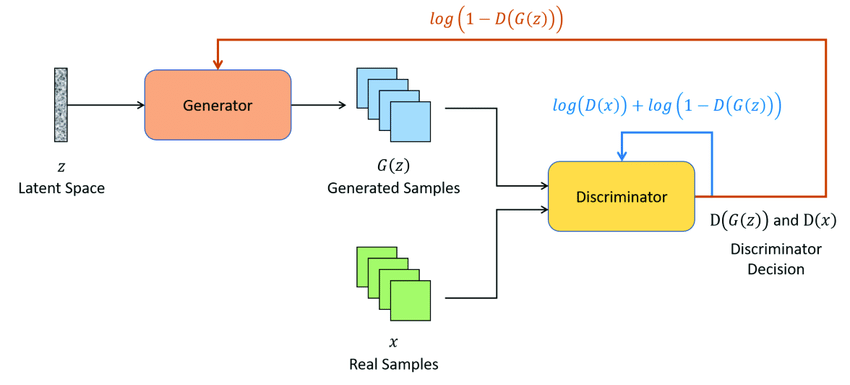

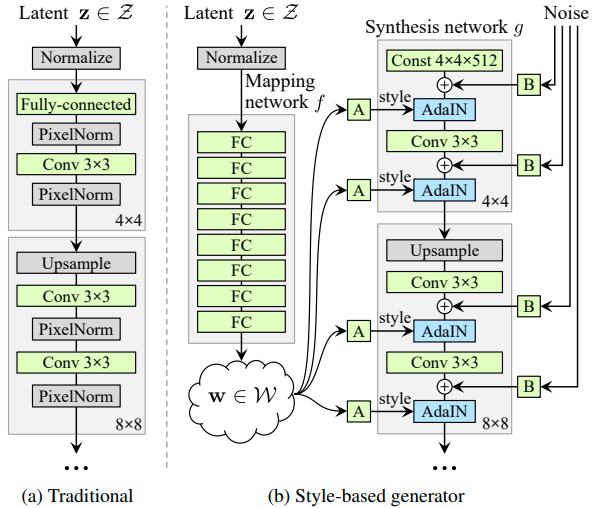

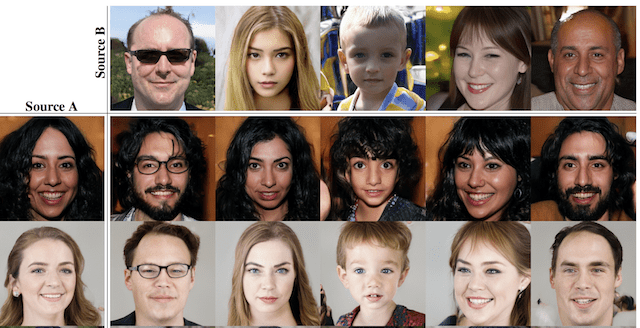

style-GAN可以通过融合隐向量来创造融合风格的图片。

---

### 1.4 Diffusion Model
diffusion model的核心组件是Unet。Unet可以感知图像多个尺度的信息。

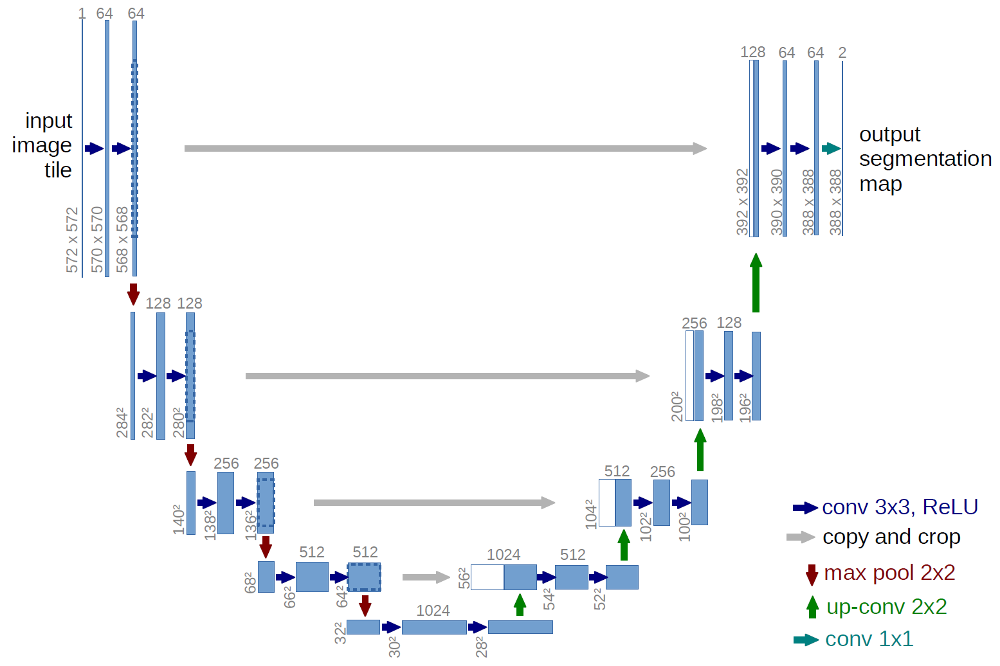

diffusion的训练过程diffusion process是从t0到tn逐步计算噪声；推理过程denoising process则是反向，从tn到t0做降噪。

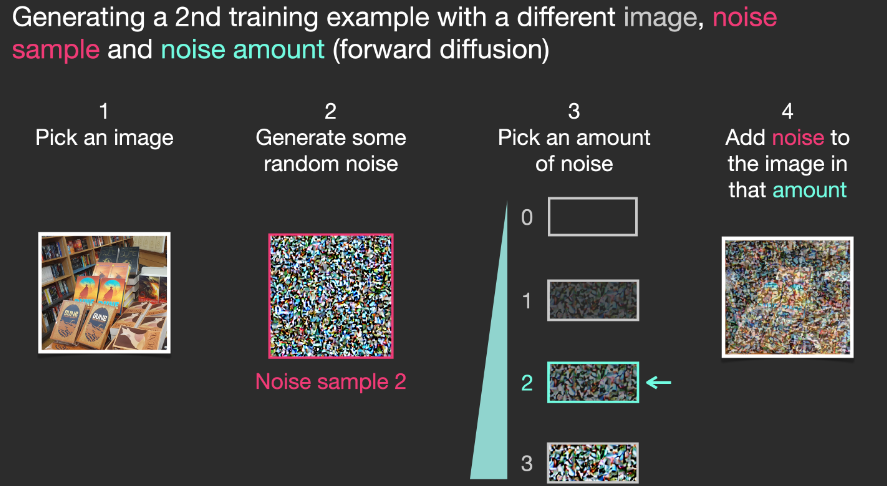

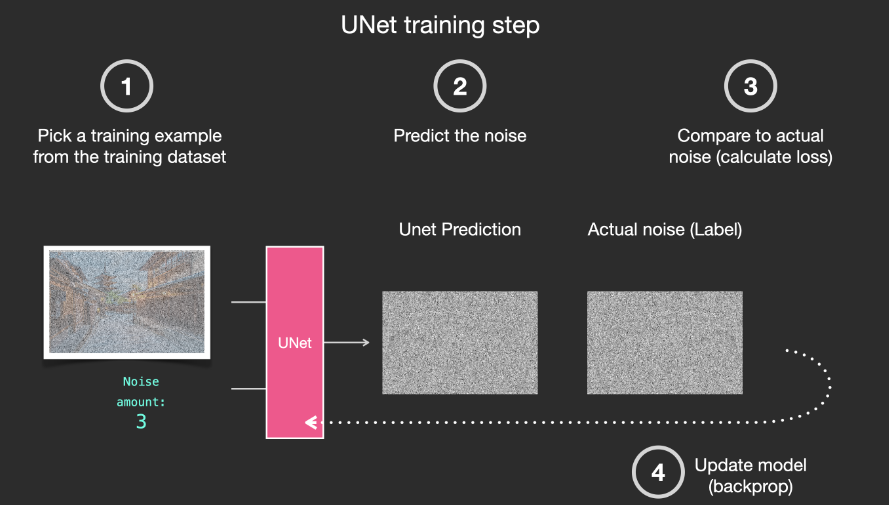

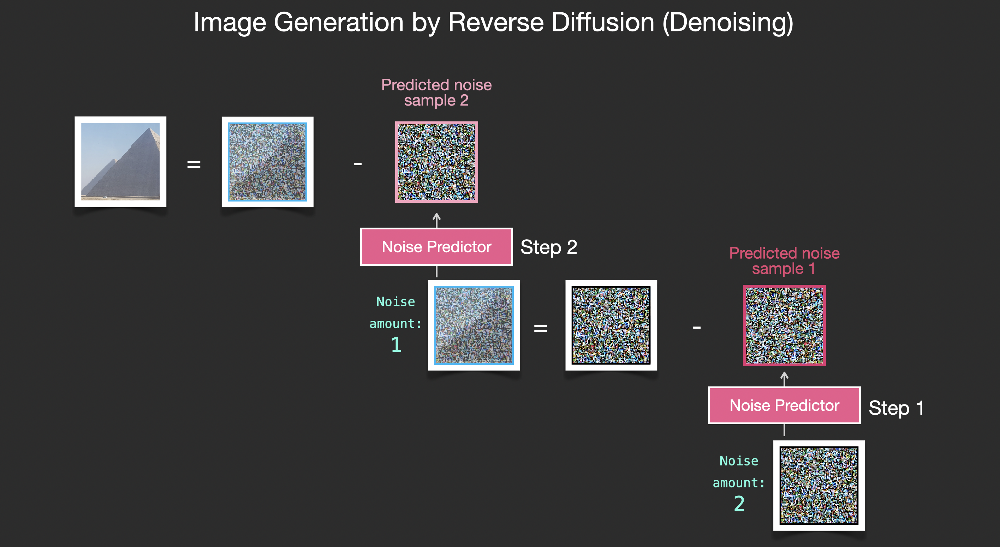



 70%|██████▉   | 699/1000 [00:29<00:12, 24.39it/s]

t =  tensor(300)


'Image at step 700'

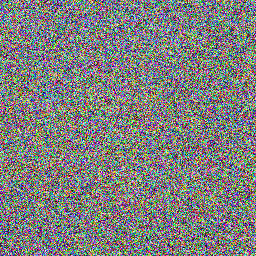


 75%|███████▍  | 747/1000 [00:31<00:10, 24.29it/s]

t =  tensor(250)


'Image at step 750'

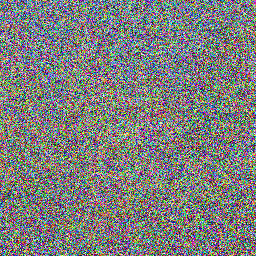


 80%|███████▉  | 798/1000 [00:33<00:08, 23.93it/s]

t =  tensor(200)


'Image at step 800'

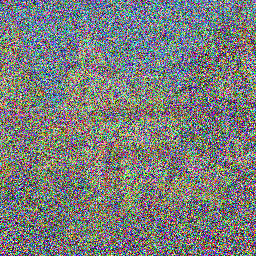


 85%|████████▍ | 849/1000 [00:35<00:06, 24.24it/s]

t =  tensor(150)


'Image at step 850'

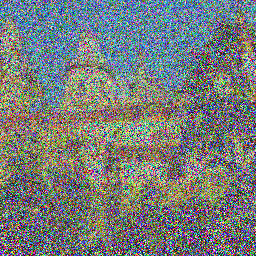


 90%|████████▉ | 897/1000 [00:37<00:04, 23.95it/s]

t =  tensor(100)


'Image at step 900'

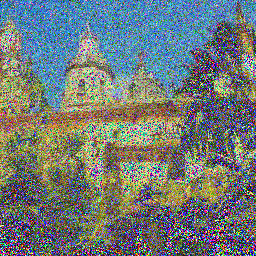


 95%|█████████▍| 948/1000 [00:39<00:02, 23.83it/s]

t =  tensor(50)


'Image at step 950'

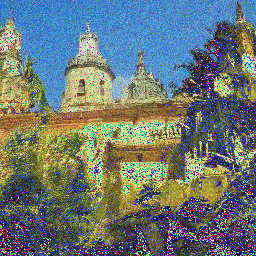


100%|█████████▉| 999/1000 [00:41<00:00, 23.85it/s]

t =  tensor(0)


'Image at step 1000'

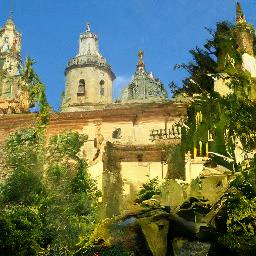

100%|██████████| 1000/1000 [00:41<00:00, 23.90it/s]


In [5]:
import PIL.Image
import numpy as np
import tqdm
import torch
from diffusers import DDPMScheduler
from diffusers import UNet2DModel

def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)

    image_pil = PIL.Image.fromarray(image_processed[0])
    display(f"Image at step {i}")
    display(image_pil)

repo_id = "google/ddpm-church-256"
model = UNet2DModel.from_pretrained(repo_id)

torch.manual_seed(0)
noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)

scheduler = DDPMScheduler.from_config(repo_id)
model.to("cuda")
noisy_sample = noisy_sample.to("cuda")
sample = noisy_sample



for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
  # 1. 预测第t步的残差
  with torch.no_grad():
      residual = model(sample, t).sample

  # 2. 通过消除残差，得到第t步的降噪图片 set x_t -> x_t-1
  sample = scheduler.step(residual, t, sample).prev_sample

  # 3. 800步后每20步展示一次
  if t <= 300 and (i + 1) % 50 == 0:
      print("t = ", str(t))
      display_sample(sample, i + 1)

2020年之后，模型生成的图片质量逐渐到达瓶颈，同时由于nlp大模型技术的兴起，学术界的兴趣开始往nlp+cv多模态生成模型的方向发展。
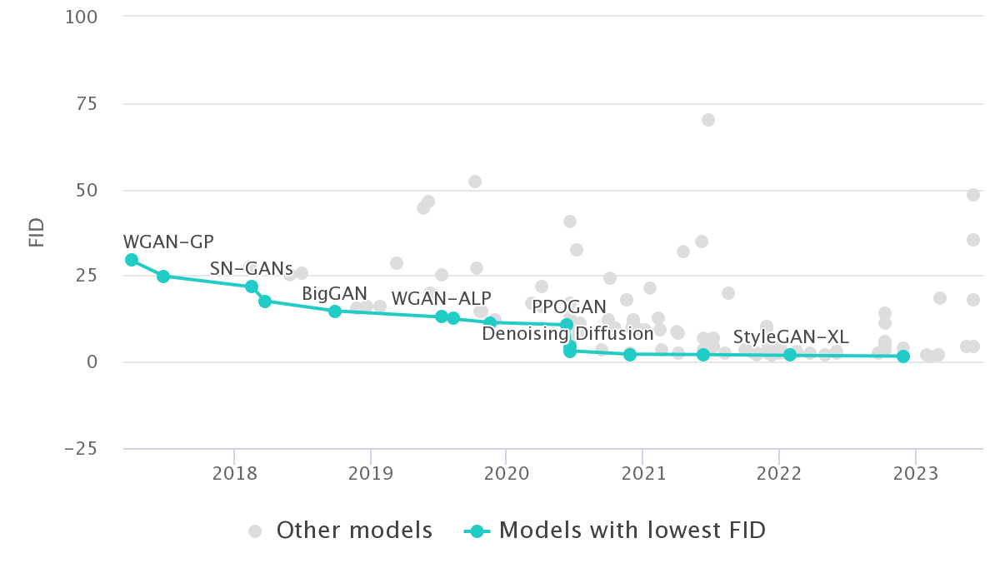

---


## 1.5 CLIP & DALLE



*   CLIP通过contrastive learning学习文本embedding与图片embedding之间的关系；
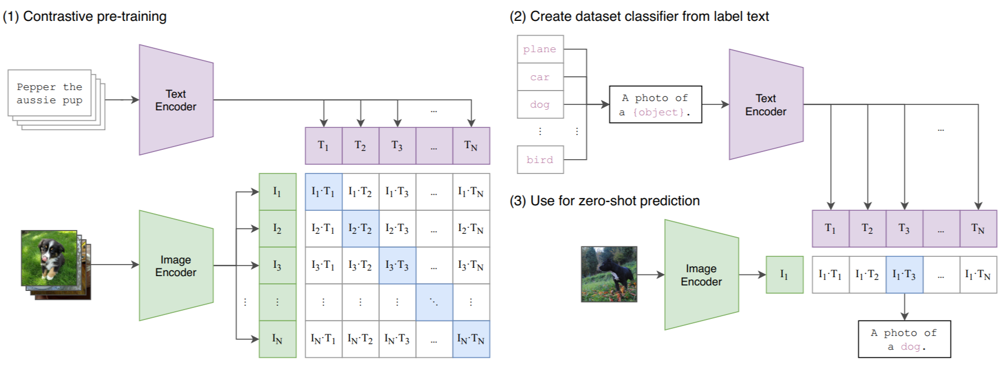
*   DALLE使用CLIP的text encoder生成隐向量，再用decoder生成图片。
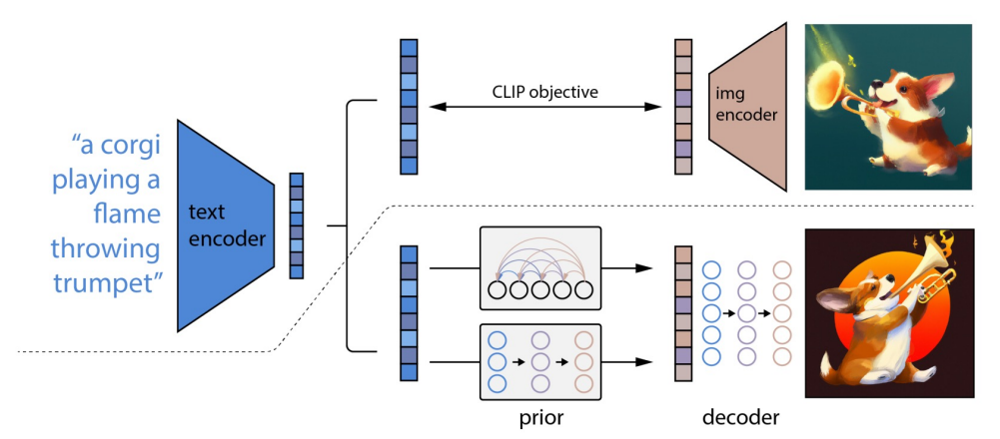


---

# **2. Stable Diffusion**
## 2.1 stable diffusion 是什么

midjourney，novelAI，文心等等商用文生图服务，都依赖于stable diffusion。

stable diffusion可以理解为CLIP + Diffusion Model + VAE。

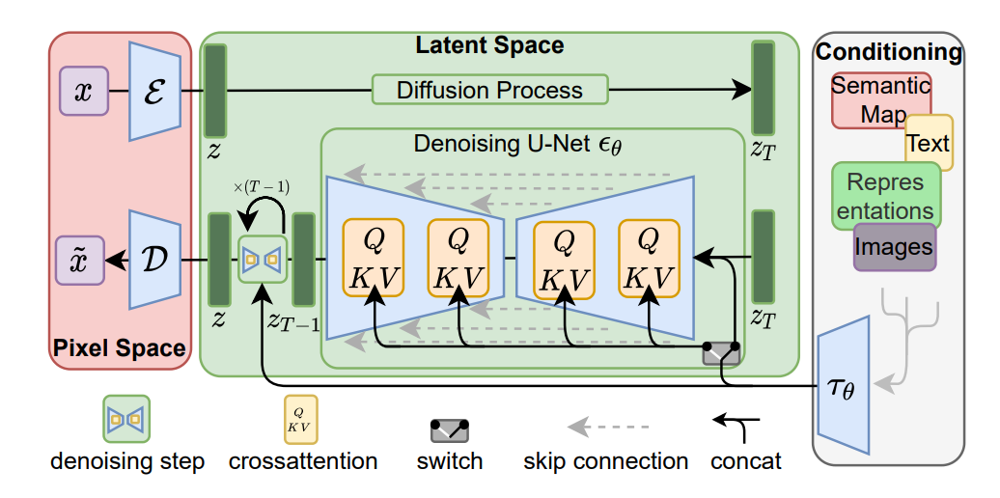

---

## **2.2 stable diffusion 怎么用**

最简单的使用方法 Stable Diffusion WebUI。本次tutorial主要聚焦diffuser库的使用。

### **2.2.1文生图**

safety_checker/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


[<class 'diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler'>, <class 'diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler'>, <class 'diffusers.schedulers.scheduling_ddim.DDIMScheduler'>, <class 'diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler'>, <class 'diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler'>, <class 'diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler'>, <class 'diffusers.schedulers.scheduling_unipc_multistep.UniPCMultistepScheduler'>, <class 'diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler'>, <class 'diffusers.schedulers.scheduling_pndm.PNDMScheduler'>, <class 'diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler'>, <class 'diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler'>, <class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>, <class 'diffusers.sch

  0%|          | 0/50 [00:00<?, ?it/s]

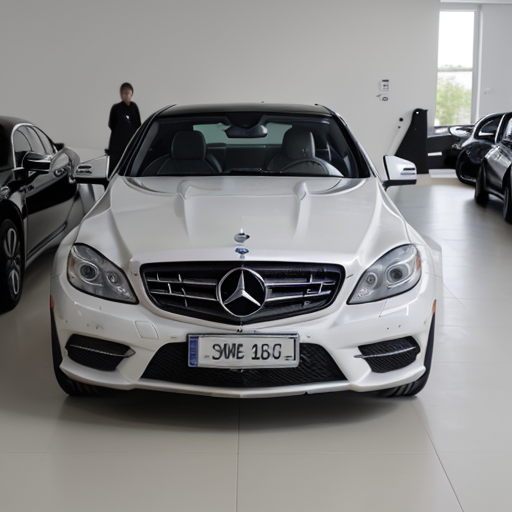

In [37]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler, DPMSolverSDEScheduler
device = "cuda"
repo_id = "stablediffusionapi/epicrealism-v4"

pipe = StableDiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)
print(pipe.scheduler.compatibles)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

prompt = "Photo of a Benz car"
image = pipe(prompt).images[0]
image

  0%|          | 0/100 [00:00<?, ?it/s]

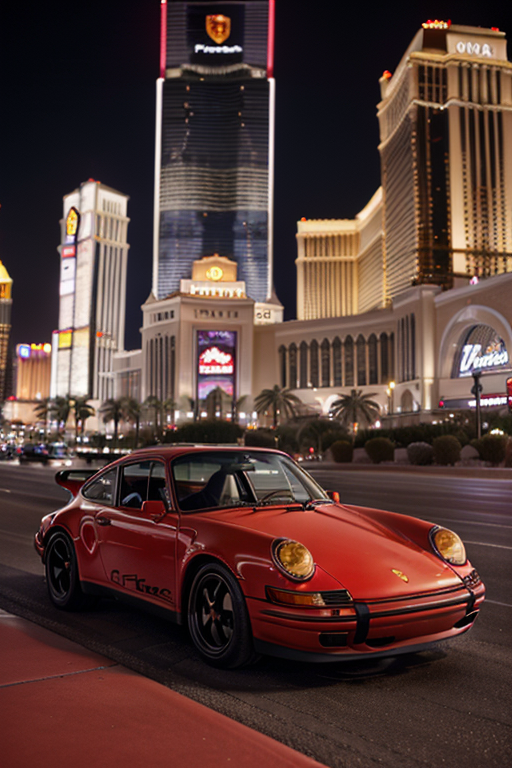

In [47]:
prompt = "Photo of a classic red porsche 911 parked in las vegas strip at night"
# 负面prompt，用作噪声初始化
negative_prompt = "cartoon, painting, illustration, (worst quality, low quality, normal quality:2)"
# 随机种子
generator = torch.Generator(device=device).manual_seed(666758058)
image = pipe(
    prompt,
    negative_prompt=negative_prompt,
    width=512,         # 宽
    height=768,         # 高
    guidance_scale=10,       # CFG
    num_inference_steps=100,     # 推理步数
    generator = generator
).images[0]
image

### **2.2.2 图生图**

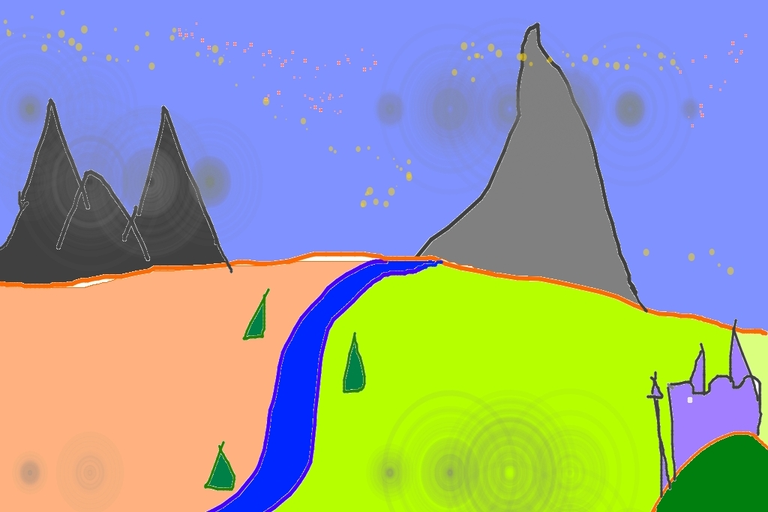

In [48]:
import requests
from io import BytesIO
from PIL import Image

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
init_img = init_img.resize((768, 512))
init_img

safety_checker/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/diffusers/configuration_utils.py:239: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/22 [00:00<?, ?it/s]

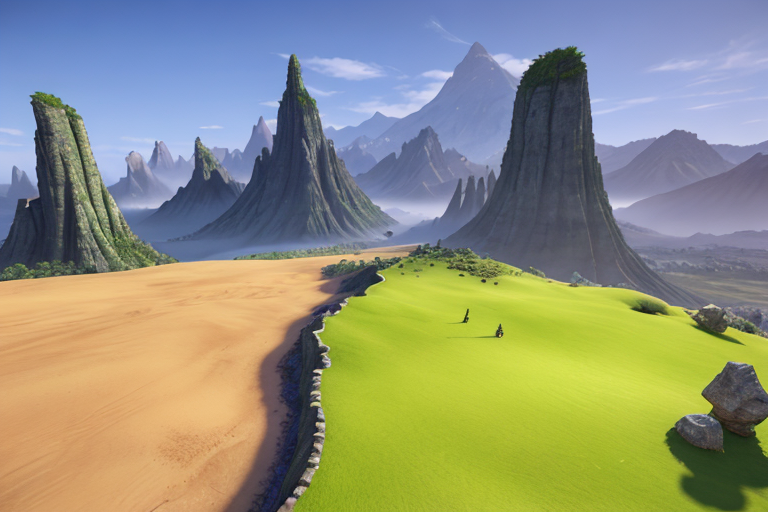

In [49]:
import inspect
import warnings
from typing import List, Optional, Union

import torch
from tqdm.auto import tqdm

from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
repo_id = "stablediffusionapi/epicrealism-v4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    repo_id,
    torch_dtype=torch.float16,
)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(repo_id, subfolder="scheduler")
pipe = pipe.to(device)
prompt = "A fantasy landscape, trending on artstation"
negative_prompt = "(worst quality, low quality, normal quality:2)"
# prompt = "RAW Photo, a river and hills, chilly nature documentary film photography BREAK detailed, sunrays, sunlight, cinematic lighting, professional colorgraded"
# negative_prompt = "cartoon, painting, illustration, (worst quality, low quality, normal quality:2)"
generator = torch.Generator(device=device).manual_seed(1024)
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=init_img,
    strength=0.75,
    guidance_scale=5,
    num_inference_steps=30,
    generator=generator
).images[0]
image

### **2.2.3 controlnet**

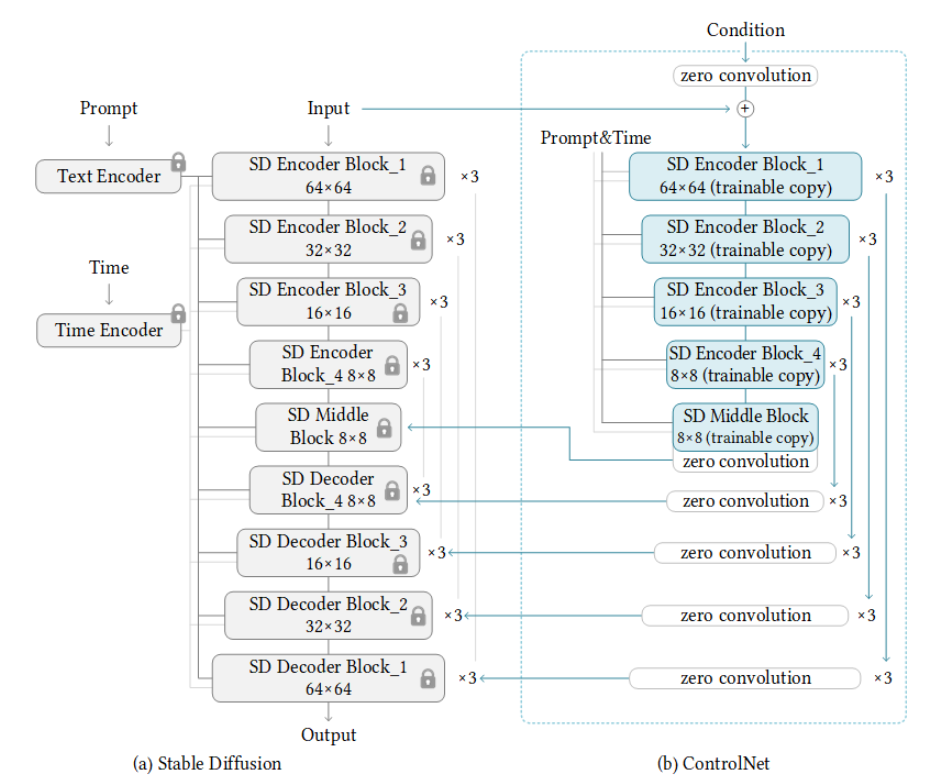

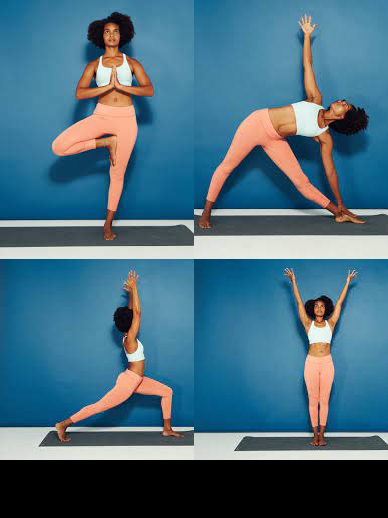

In [50]:
from diffusers.utils import load_image
from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [
    load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url)
    for url in urls
]

image_grid(imgs, 2, 2)

/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(


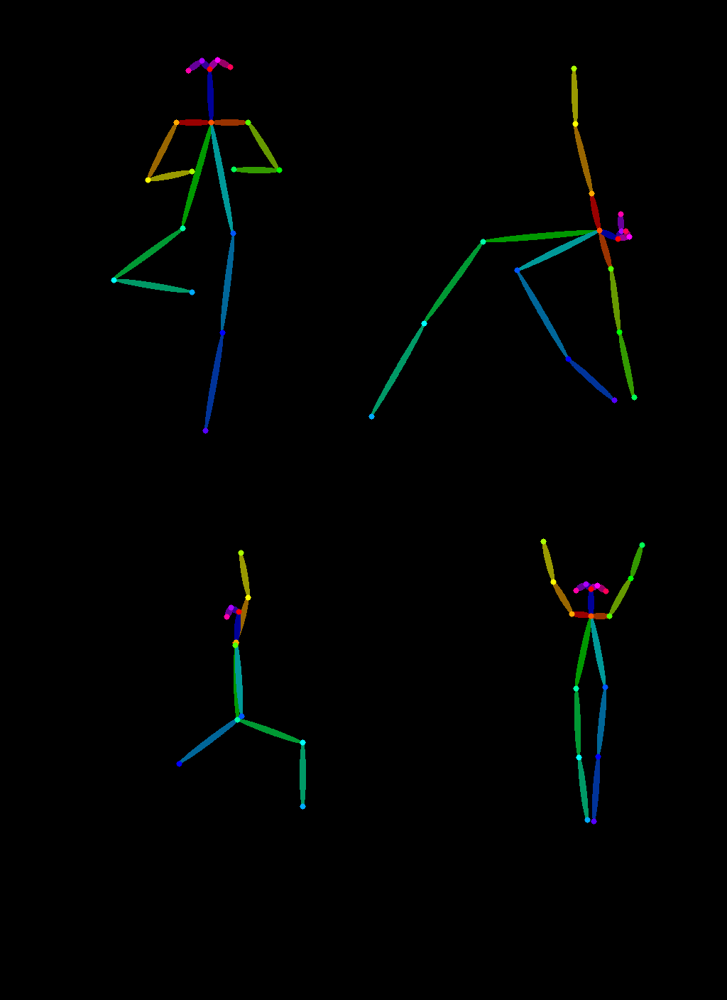

In [51]:
from controlnet_aux import OpenposeDetector

model = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")

poses = [model(img) for img in imgs]
image_grid(poses, 2, 2)

safety_checker/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

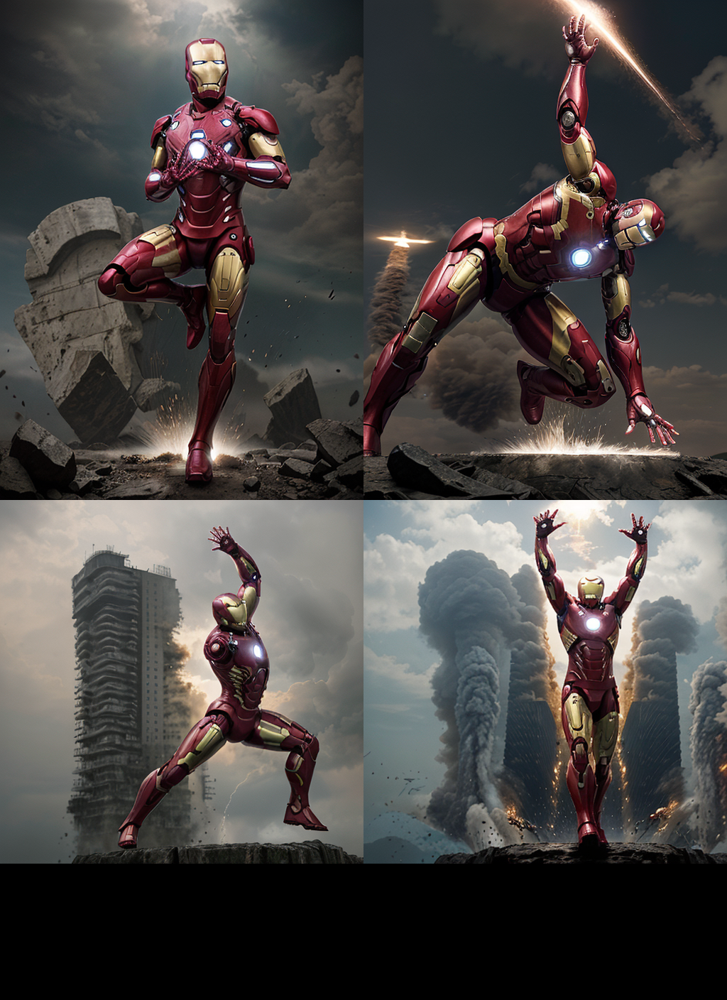

In [64]:
import torch
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

controlnet = ControlNetModel.from_pretrained(
    "fusing/stable-diffusion-v1-5-controlnet-openpose", torch_dtype=torch.float16
)

device = "cuda"
repo_id = "stablediffusionapi/epicrealism-v4"
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    repo_id,
    controlnet=controlnet,
    torch_dtype=torch.float16,
)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

generator = [torch.Generator(device=device).manual_seed(9999) for i in range(4)]
prompt = "photo of iron man"
# negative_prompt="cartoon, 3d, (disfigured), (bad art), (deformed), (poorly drawn), (extra limbs), strange colors, blurry, boring, sketch, lackluster, repetitive, cropped, (hands), nudity, watermark, signature, text, embossing, oversaturated colors, beard, (ERA09NegV1:0.9)"
outputs = []
for i in range(4):
  output = pipe(
      prompt,
      poses[i],
      # negative_prompt=negative_prompt,
      generator=generator[i],
      guidance_scale=5,
      num_inference_steps=30
  )
  outputs.append(output.images[0])
image_grid(outputs, 2, 2)

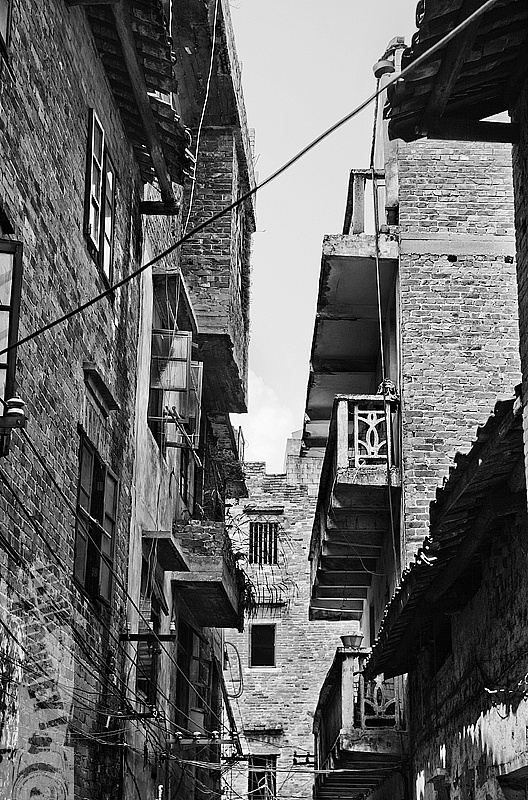

In [74]:
image = load_image(
    "https://img.zcool.cn/community/01991755494a650000019ae940f8e2.jpg@1280w_1l_2o_100sh.jpg"
)
image

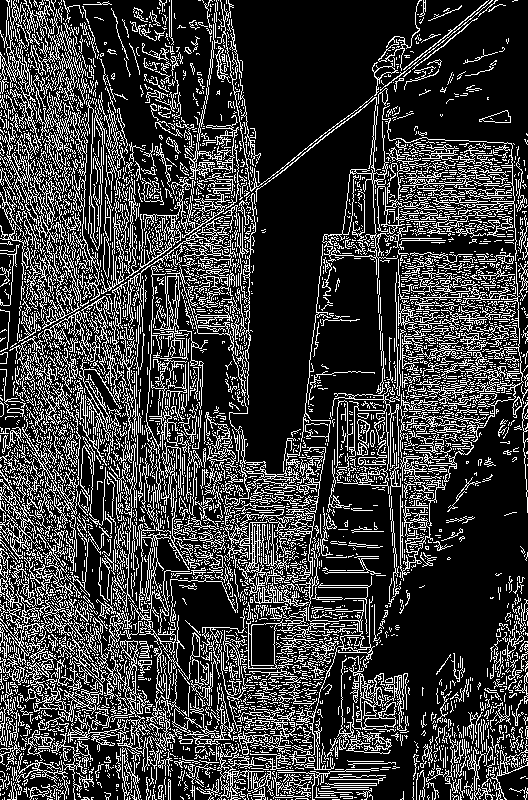

In [75]:
import cv2
from PIL import Image
import numpy as np

image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

safety_checker/model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

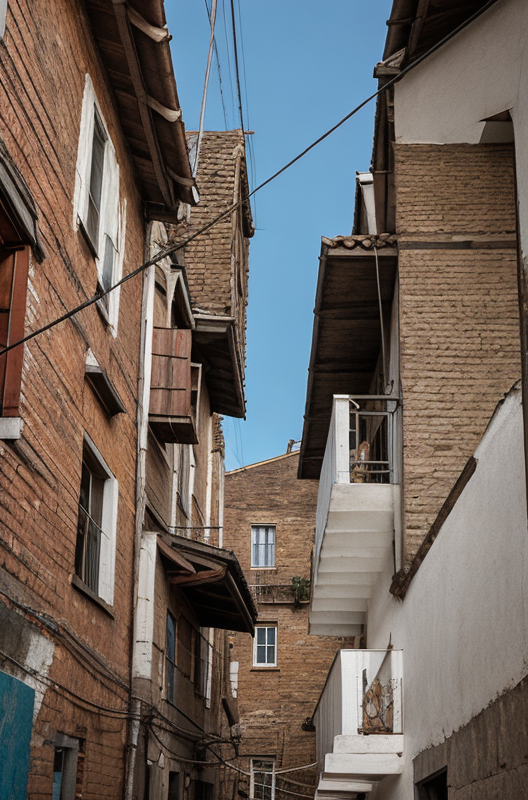

In [76]:
# Control net guess mode
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny")
pipe = StableDiffusionControlNetPipeline.from_pretrained("stablediffusionapi/epicrealism-v4", controlnet=controlnet).to(
    "cuda"
)
image = pipe("", image=canny_image, guess_mode=True, guidance_scale=3.0).images[0]
image


---

## **2.3 Stable Diffusion 怎么fine-tune**

如何让SD学会新的概念？

效果最好：dreambooth

速度最快，模型最小：LORA

### **2.3.1 Textual Inversion**

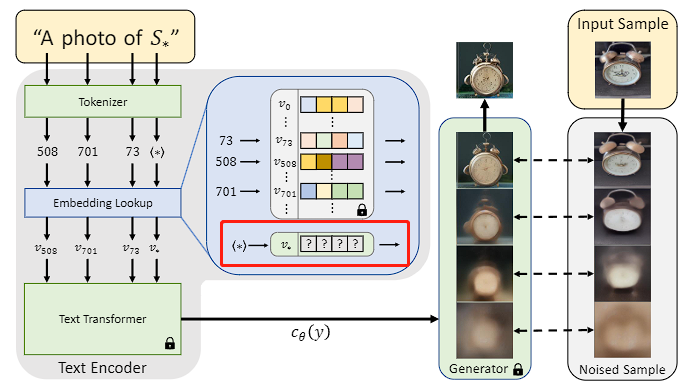

### **2.3.2 DreamBooth**

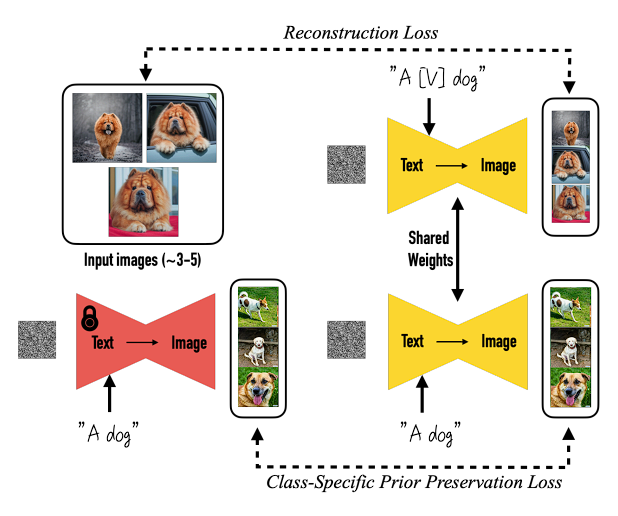

### **2.3.3 LORA**

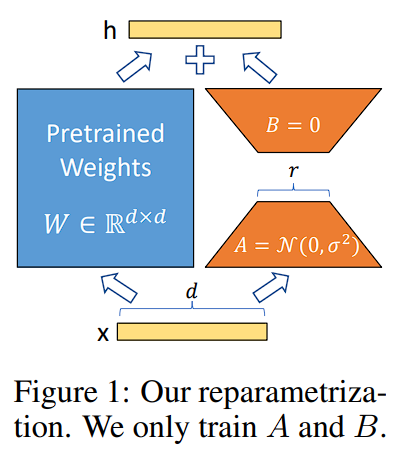

## **2.4 Assignment**

选择一个自己喜欢的模型，并finetune一个新概念（人或者物品或者艺术风格等），并用文生图、图生图、control-net方法分别生成图片，prompt需要涵盖：新引入的概念主体、主体行为。

# **3. 推荐系统中diffusion model的应用**

## **3.1 风格个性化**

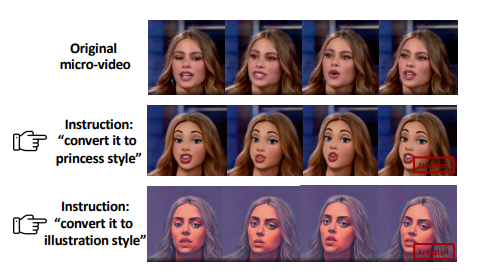



## **3.2 协同过滤**

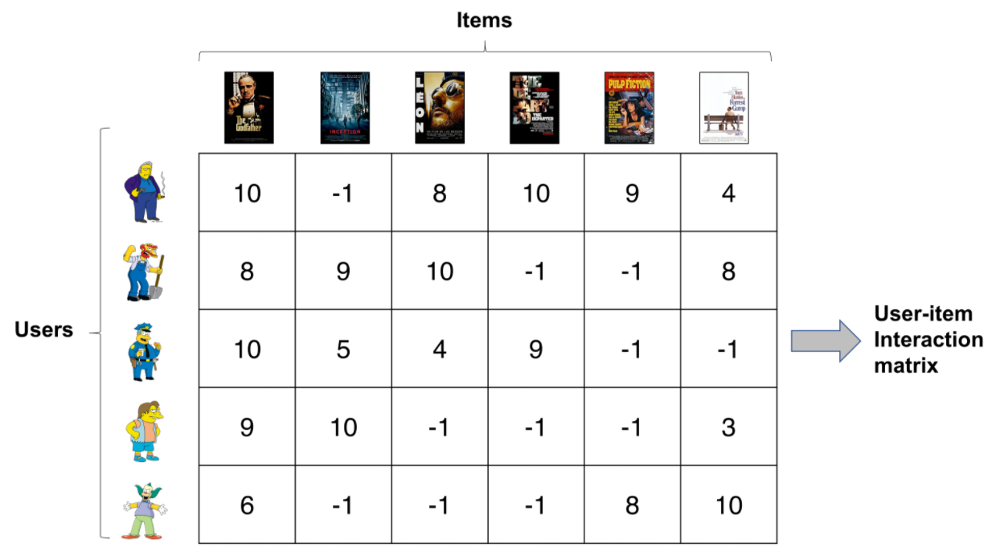

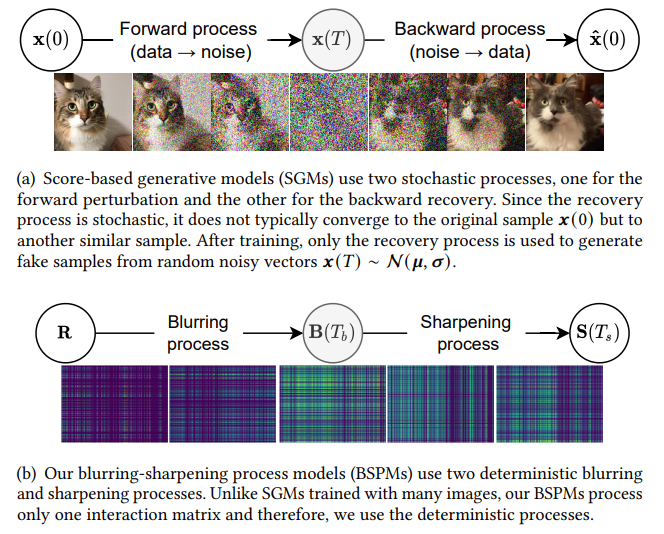

## **3.3 通过对用户购买历史diffusion估计用户兴趣分布**

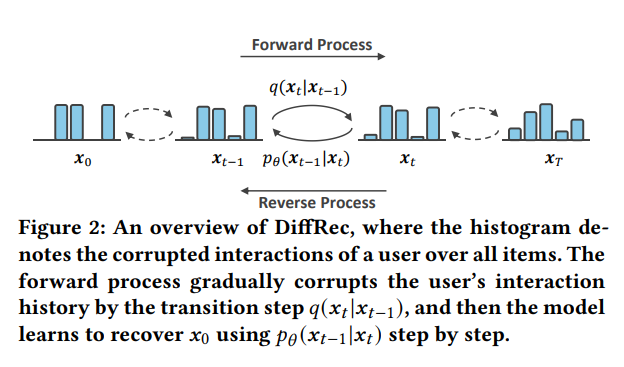

# **参考资料**
A Comprehensive Survey of AI-Generated Content (AIGC):
A History of Generative AI from GAN to ChatGPT https://arxiv.org/pdf/2303.04226.pdf

A Style-Based Generator Architecture for Generative Adversarial Networks https://arxiv.org/abs/1812.04948

Learning Transferable Visual Models From Natural Language Supervision https://arxiv.org/abs/2103.00020

High-Resolution Image Synthesis with Latent Diffusion Models https://arxiv.org/abs/2112.10752

Adding Conditional Control to Text-to-Image Diffusion Models https://arxiv.org/abs/2302.05543

An Image is Worth One Word: Personalizing Text-to-Image Generation using Textual Inversion https://arxiv.org/abs/2208.01618

DreamBooth: Fine Tuning Text-to-Image Diffusion Models for Subject-Driven Generation https://arxiv.org/abs/2208.12242

LoRA: Low-Rank Adaptation of Large Language Models https://arxiv.org/abs/2106.09685

paper with code image generation leader board https://paperswithcode.com/sota/image-generation-on-cifar-10

illustrated stable diffusion https://jalammar.github.io/illustrated-stable-diffusion/

huggingface diffusers 文档 https://huggingface.co/docs/diffusers/index

huggingface notebooks https://github.com/huggingface/notebooks

---

Generative Recommendation: Towards Next-generation Recommender Paradigm https://arxiv.org/abs/2304.03516

Blurring-Sharpening Process Models for Collaborative Filtering https://arxiv.org/pdf/2211.09324.pdf

Diffusion Recommender Model https://arxiv.org/pdf/2304.04971.pdf
